In [1]:
cd ..\object_detection

C:\Users\nick\Desktop\tfcv\object_detection


In [2]:
import os
import numpy as np
import multiprocessing
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pprint import pprint

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Conv2D, Flatten, Dropout, MaxPooling2D, Concatenate, UpSampling2D, Add, Reshape
import tensorflow_datasets as tfds
#import tensorflow_hub as hub

from anchors import Anchors, AnchorUtils, compute_targets
from context_layers import ClassificationSubnet, RegressionSubnet
from filters import RegressBoxes, FilterDetections, ClipBoxes
from losses import focal_loss
from visualizations import plot_boxes
from augmentations import unnormalize_boxes, resize, filter_boxes, clip_boxes, random_crop, tf_random_horizontal_flip, photometric_color_distortion

In [3]:
print(f'Tensorflow Version: {tf.__version__}')
print(f'TFDS Version: {tfds.__version__}')
print(f"GPU: {tf.config.list_physical_devices('GPU')}")

tf.keras.backend.clear_session()  # For easy reset of notebook state.

Tensorflow Version: 2.2.0
TFDS Version: 2.1.0
GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
#tf.compat.v1.enable_eager_execution()
tf.executing_eagerly()

True

# 1. Tensorflow Datasets (TFDS)

In [5]:
#import warnings
#warnings.filterwarnings('ignore')
train, info = tfds.load('wider_face', split="train", with_info=True)
validation = tfds.load('wider_face', split="validation")

In [6]:
info

tfds.core.DatasetInfo(
    name='wider_face',
    version=0.1.1,
    description='WIDER FACE dataset is a face detection benchmark dataset, of which images are 
selected from the publicly available WIDER dataset. We choose 32,203 images and 
label 393,703 faces with a high degree of variability in scale, pose and 
occlusion as depicted in the sample images. WIDER FACE dataset is organized 
based on 61 event classes. For each event class, we randomly select 40%/10%/50% 
data as training, validation and testing sets. We adopt the same evaluation 
metric employed in the PASCAL VOC dataset. Similar to MALF and Caltech datasets,
we do not release bounding box ground truth for the test images. Users are 
required to submit final prediction files, which we shall proceed to evaluate.',
    homepage='http://shuoyang1213.me/WIDERFACE/',
    features=FeaturesDict({
        'faces': Sequence({
            'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
            'blur': tf.uint8,
            

In [7]:
# data comes in tuples with a 28x28x1 array of uint8 for the images and 1 uint64 label
for ex in train.take(1):
    pprint(ex)

{'faces': {'bbox': <tf.Tensor: shape=(1, 4), dtype=float32, numpy=array([[0.5625    , 0.30208334, 0.62890625, 0.37239584]], dtype=float32)>,
           'blur': <tf.Tensor: shape=(1,), dtype=uint8, numpy=array([1], dtype=uint8)>,
           'expression': <tf.Tensor: shape=(1,), dtype=bool, numpy=array([ True])>,
           'illumination': <tf.Tensor: shape=(1,), dtype=bool, numpy=array([ True])>,
           'invalid': <tf.Tensor: shape=(1,), dtype=bool, numpy=array([ True])>,
           'occlusion': <tf.Tensor: shape=(1,), dtype=uint8, numpy=array([0], dtype=uint8)>,
           'pose': <tf.Tensor: shape=(1,), dtype=bool, numpy=array([ True])>},
 'image': <tf.Tensor: shape=(768, 1024, 3), dtype=uint8, numpy=
array([[[18, 19, 14],
        [18, 19, 14],
        [17, 18, 13],
        ...,
        [88, 76, 28],
        [87, 74, 29],
        [86, 73, 28]],

       [[15, 16, 11],
        [15, 16, 11],
        [15, 16, 11],
        ...,
        [89, 77, 29],
        [88, 75, 30],
        [86, 7

In [8]:
def preprocess(features):
    """Basic Preprocessing and Augmentations to visualized"""
    img = tf.cast(features['image'], dtype=tf.float32)
    img = photometric_color_distortion(img)
    img = img / 255.0
    
    bboxes = features['faces']['bbox']
    bboxes = tf.concat(bboxes, axis=0)
    
    #data augmentations
    bboxes = filter_boxes(bboxes) #remove invalid
    img, bboxes = random_crop(img, bboxes, clip=False)
    bboxes = clip_boxes(bboxes, clip_min=0, clip_max=1)
    bboxes = filter_boxes(bboxes) #remove ones no longer in the image
    img, bboxes = resize(img, bboxes, height=640, width=640)
    img, bboxes = tf_random_horizontal_flip(img, bboxes)
    
    return img, bboxes

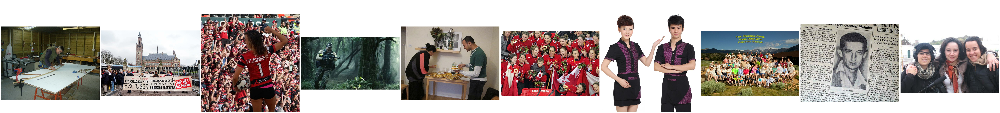

In [9]:
def plot_images(ds=train, n=5, fig_size=128, font_size=32, show_boxes=False):
    """Plot n samples of images"""
    examples = ds.take(n)
    # 28x28 to visualize (dont need the color channel)
    
    imgs = [x['image'].numpy() for x in examples]
     # use our int2str to get string of int labels
    labels = [x['image/filename'].numpy() for x in examples]
    # separate the class since it is pretty long
    labels = [list(os.path.split(l))[-1:][0] for l in labels]
    all_faces = [x['faces']['bbox'] for x in examples]
    
    def transform_bbox(bbox, img_width, img_height):
        #  (ymin, xmin, ymax, xmax) -> (xmin, ymin, w, h)
        [x_min, x_max] = np.array([x_min, x_max])*img_width
        [y_min, y_max] = np.array([y_min, y_max])*img_height
        w = (xmax - xmin) 
        h = ymax - ymin 
        return [xmin, ymin, w, h]
    
    fig, axes = plt.subplots(1, len(imgs), figsize=(fig_size, fig_size))
    axes = axes.flatten()
    for img, ax, label, faces in zip(imgs, axes, labels, all_faces):
        ax.imshow(img)
        #ax.set_title(label, color='w', fontsize=font_size)
        ax.set_title(str(faces.shape[0]), color='w', fontsize=font_size)
        ax.axis('off')
                
    plt.tight_layout()
    plt.show()
    
faces=plot_images(n=10, font_size=128)

# 2. Preprocessing

In [10]:
anchors = AnchorUtils()
all_anchors = anchors.generate_all_anchors()
print(all_anchors.shape)

(102300, 4)


In [11]:
def process(features, anchors=all_anchors, resolution=640):
    """Full preprocessing"""
    img = tf.cast(features['image'], dtype=tf.float32)
    img = photometric_color_distortion(img)
    img = img / 255.0
    
    bboxes = features['faces']['bbox']
    bboxes = tf.concat(bboxes, axis=0)
    
    #data augmentations
    bboxes = filter_boxes(bboxes) #filter invalid boxes
    #img, bboxes = random_crop(img=img, bboxes=bboxes, clip=True, min_boxes=0)
    img, bboxes = resize(img, bboxes, height=resolution, width=resolution)
    img, bboxes = tf_random_horizontal_flip(img, bboxes)
    
    unnormalized_bboxes = unnormalize_boxes(bboxes, img_width=resolution, img_height=resolution)
    classification_targets, regression_targets = compute_targets(all_anchors, unnormalized_bboxes, num_classes=2, labels=None, negative_iou_thresh=0.3, positive_iou_thresh=0.5)
    
    return img, (classification_targets, regression_targets)

In [12]:
def load_backbone(name='resnet50', input_shape=(640, 640, 3)):
    if name=='resnet50':
        model =  tf.keras.applications.ResNet50(weights='imagenet', input_shape=(640, 640, 3), include_top=False)

        backbone_model = tf.keras.Model(inputs=model.input,
                                        outputs=[model.get_layer("conv4_block6_out").output,
                                                 model.get_layer("conv3_block4_out").output,
                                                 model.get_layer("conv2_block3_out").output,
                                                 model.output])
    else:
        raise ValueError("Backbone model must be one of 'resnet50' or 'resnet152'")
    return backbone_model

In [13]:
# model =  tf.keras.applications.ResNet50(weights='imagenet', input_shape=(640, 640, 3), include_top=False)

# backbone_model = tf.keras.Model(inputs=model.input,
#                                 outputs=[model.get_layer("conv4_block6_out").output,
#                                          model.get_layer("conv3_block4_out").output,
#                                          model.get_layer("conv2_block3_out").output,
#                                          model.output])

# for ex in train.take(1):
#     img, (class_targets, regress_targets) = process(ex)
#     temp = model(tf.expand_dims(img, 0))

# 3. Model

In [14]:
#model subclassing not working b/c Add layer doesnt catch shape changes
tf.keras.backend.clear_session() 

class RetinaFace(tf.keras.Model):
    def __init__(self, input_shape=(640, 640, 3), backbone='resnet50'):
        super(RetinaFace, self).__init__()
        self.backbone_name = backbone
        self.backbone_model = load_backbone(self.backbone_name)                              
        self.backbone_model.trainable = False # freeze all layers of ResNet
        
        self.p2_lateral_conv = Conv2D(256, kernel_size=(1, 1), strides=1, padding='same', activation=None, name='p2_lateral_conv')
        self.p2_lc_reshape = tf.keras.layers.Reshape((160, 160, 256))
        self.p3_upsample =  UpSampling2D(size=(2, 2), name='p3_upsampled')
        self.p2_add = Add(name='p2_add')
        
        self.p3_lateral_conv = Conv2D(256, kernel_size=(1, 1), strides=1, padding='same', activation=None, name='p3_lateral_conv')
        self.p3_lc_reshape = tf.keras.layers.Reshape((80, 80, 256))
        self.p4_upsample =  UpSampling2D(size=(2, 2), name='p4_upsampled')
        self.p3_add = Add(name='p3_add')
        
        self.p4_lateral_conv = Conv2D(256, kernel_size=(1, 1), strides=1, padding='same', activation=None, name='p4_lateral_conv')
        self.p4_lc_reshape = tf.keras.layers.Reshape((40, 40, 256))
        self.p5_upsample =  UpSampling2D(size=(2, 2), name='p5_upsampled')
        self.p4_add = Add(name='p4_add')
        
        self.p5_lateral_conv = Conv2D(256, kernel_size=(1, 1), strides=1, padding='same', activation=None, name='p5_lateral_conv')
        # glorot same as xavier
        self.p6_lateral_conv = Conv2D(256, kernel_size=(3, 3), strides=2, padding='same', activation=None, kernel_initializer='glorot_normal', name='p6_lateral_conv')
    
        self.p4_conv_out =  Conv2D(256, kernel_size=(3, 3), strides=1, padding='same', activation=None, name='p4_conv_out')
        self.p3_conv_out = Conv2D(256, kernel_size=(3, 3), strides=1, padding='same', activation=None, name='p3_conv_out')
        self.p2_conv_out = Conv2D(256, kernel_size=(3, 3), strides=1, padding='same', activation=None, name='p2_conv_out')
        
        self.classification_subnet = ClassificationSubnet(K=1, A=3, prior=.01)
        self.regression_subnet = RegressionSubnet(n_landmarks=4, A=3)
        
        self.classification_concat = tf.keras.layers.Concatenate(axis=1, name='classification_outputs')
        self.regression_concat = tf.keras.layers.Concatenate(axis=1, name='regression_outputs')
        
    def call(self, inputs):
        
        #batch_size = inputs.get_shape()[0]
        batch_size = tf.shape(inputs)[0]
        x = self.backbone_model(inputs)
        c4 = x[0]
        c3 = x[1]
        c2 = x[2]
        c5 = x[3]
        p6 = self.p6_lateral_conv(c5)
        p5 = self.p5_lateral_conv(c5)
        
        p4_lateral_conv = self.p4_lateral_conv(c4)
        p4_lateral_conv = tf.reshape(p4_lateral_conv, [batch_size, 40, 40, 256])
        #p4_lateral_conv = self.p4_lc_reshape(p4_lateral_conv)
        p5_upsampled = self.p5_upsample(p5)
        p4_add = self.p4_add([p4_lateral_conv, p5_upsampled])
        p4 = self.p4_conv_out(p4_add)
        
        p3_lateral_conv = self.p3_lateral_conv(c3)
        p3_lateral_conv = tf.reshape(p3_lateral_conv, [batch_size, 80, 80, 256])
        #p3_lateral_conv = self.p3_lc_reshape(p3_lateral_conv)
        p4_upsampled = self.p4_upsample(p4)
        p3_add = self.p3_add([p3_lateral_conv, p4_upsampled])
        p3 = self.p3_conv_out(p3_add)
        
        #named the same thing in ResNet50 and ResNet152
        p2_lateral_conv = self.p2_lateral_conv(c2)
        p2_lateral_conv = tf.reshape(p2_lateral_conv, [batch_size, 160, 160, 256])
        #p2_lateral_conv = self.p2_lc_reshape(p2_lateral_conv)
        p3_upsampled = self.p3_upsample(p3)
        p2_add = self.p2_add([p2_lateral_conv, p3_upsampled])
        p2 = self.p2_conv_out(p2_add)
        
        features = [p2, p3, p4, p5, p6]
        
        #return features
        p2_class_outputs = self.classification_subnet(p2)
        p3_class_outputs = self.classification_subnet(p3)
        p4_class_outputs = self.classification_subnet(p4)
        p5_class_outputs = self.classification_subnet(p5)
        p6_class_outputs = self.classification_subnet(p6)
        
        classification_outputs = self.classification_concat([p2_class_outputs,
                                                             p3_class_outputs,
                                                             p4_class_outputs,
                                                             p5_class_outputs,
                                                             p6_class_outputs])
        
        p2_regression_outputs = self.regression_subnet(p2)
        p3_regression_outputs = self.regression_subnet(p3)
        p4_regression_outputs = self.regression_subnet(p4)
        p5_regression_outputs = self.regression_subnet(p5)
        p6_regression_outputs = self.regression_subnet(p6)
        
        regression_outputs = self.classification_concat([p2_regression_outputs,
                                                         p3_regression_outputs,
                                                         p4_regression_outputs,
                                                         p5_regression_outputs,
                                                         p6_regression_outputs])

        # K=2 since face or not face
#         classification_outputs = []
#         for feature_layer in features:
#             classification_outputs.append(self.classification_subnet(feature_layer))
#         classification_outputs = self.classification_concat(classification_outputs)
        
#         # bounding box regression
#         regression_outputs = []
#         for feature_layer in features:
#             regression_outputs.append(self.regression_subnet(feature_layer))
#         regression_outputs = self.regression_concat(regression_outputs)
        
#         # facial landmark regression
#         landmarks_outputs = []
#         for feature_layer in features:
#             landmarks_outputs.append(RegressionSubnet(n_landmarks=5, A=3)(feature_layer))
        
        return (classification_outputs, regression_outputs)
    
    #@tf.function
    def train_step(self, data):
        # already processed to y (classification_targets, regression_target)
        img,  y_true = data
        print(f'classification targets: {y_true[0].shape}')
        print(f'regression targets: {y_true[1].shape}')
        #run through RetinaFace model to get regression transformations (n_anchors x 4) and classification scores (n_anchors x K classes)
        with tf.GradientTape() as tape:
            y_pred = self(img)
            print(f'classification_pred shape: {y_pred[0].shape}')
            print(f'regression_pred shape: {y_pred[1].shape}\n')

            #compute loss
            loss = focal_loss(y_true, y_pred)

            #compute gradients
            trainable_vars = self.trainable_variables
            gradients = tape.gradient(loss, trainable_vars)
            #update weights
            self.optimizer.apply_gradients(zip(gradients, trainable_vars))
            #update metrics
            #self.compiled_metrics.update_state(y, y_pred)
            
        #return {m.name: m.result() for m in self.metrics}
        print(f'Batch loss: {loss}')
        return {'loss': loss}
    
    def predict_step(self, img):
        pass
        

In [15]:
## RetinaFace
"""The learning rate starts from 10−3, rising to 10−2 after 5 epochs, then divided by 10 at 55 and 68 epochs. The training process terminates at 80 epochs."""

def lr_scheduler(epoch):
    if epoch <= 5:
        lr =  0.001
    elif 5 < epoch < 55:
        lr = 0.01
    elif 55 <= epoch < 68:
        lr = 0.001
    else:
        lr = 0.0001
    return lr

lr_callback = tf.keras.callbacks.LearningRateScheduler(lr_scheduler)

# tensorboard --logdir=path_to_your_logs
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='logs', write_graph=True, update_freq='epoch')

In [16]:
cores = multiprocessing.cpu_count()
print(f'# of possible workers: {cores}')

# of possible workers: 12


In [17]:
model = RetinaFace()

In [18]:
#test our model on individual images
for ex in train.take(5):
    img, (class_targets, regress_targets) = process(ex)
    (classification_outputs, regression_outputs) = model(tf.expand_dims(img, 0))
    #print(classification_outputs.shape)
    print('done')

bboxes: (1, 4)
anchors: (102300, 4)
ious: (102300, 1)

done
bboxes: (31, 4)
anchors: (102300, 4)
ious: (102300, 31)

done
bboxes: (82, 4)
anchors: (102300, 4)
ious: (102300, 82)

done
bboxes: (1, 4)
anchors: (102300, 4)
ious: (102300, 1)

done
bboxes: (2, 4)
anchors: (102300, 4)
ious: (102300, 2)

done


In [19]:
train_ds = train.map(process, num_parallel_calls=4)

# Shuffle and batch the train_dataset. Use a buffer size of 1024
# for shuffling and a batch size 32 for batching. 
train_ds = train_ds.shuffle(buffer_size=32).batch(4)

# Parallelize the loading by prefetching the train_dataset.
# Set the prefetching buffer size to tf.data.experimental.AUTOTUNE.
train_ds = train_ds.prefetch(tf.data.experimental.AUTOTUNE) 

bboxes: (None, 4)
anchors: (102300, 4)
ious: (102300, None)



In [20]:
#test our mapped and batched tensorflow dataset
it = iter(train_ds)

imgs, (classification_targets, regression_targets) =  next(it)

print(f'batch images: {imgs.shape}')
print(f'batch classification targets: {classification_targets.shape}')
print(f'batch regression targets: {regression_targets.shape}')

batch images: (4, 640, 640, 3)
batch classification targets: (4, 102300, 2)
batch regression targets: (4, 102300, 5)


In [35]:
#test our batched images
(classification_preds, regression_preds) = model(imgs)

print(f'classification preds: {classification_preds.shape}')
print(f'regression preds: {regression_preds.shape}')

classification preds: (4, 102300, 1)
regression preds: (4, 102300, 4)


*Test Loss:*
    Note that to compute binary crossentropy it will be (batch_size x n_anchors) tensor multiplied by another (batch_size x n_anchors) tensor so you may be likely to run out of memory.

In [37]:
#test loss
focal_loss((classification_targets, classification_targets), (classification_preds, regression_preds))

labels: (4, 102300, 1)
anchor_state: (4, 102300)


ResourceExhaustedError: OOM when allocating tensor with shape[406760,406760] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Mul]

In [22]:
# for ex in train:
#     img, y_true = process(ex)
#     print(f'classification targets: {y_true[0].get_shape()}')
#     print(f'regression targets: {y_true[1].get_shape()}')

In [23]:
model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.001, momentum=0.9, nesterov=False, decay=0.0005))
              #loss=focal_loss, experimental_run_tf_function=False)
              #metrics=)

In [38]:
model.fit(train_ds, epochs=80, callbacks=[lr_callback, tensorboard_callback])